**Lab 3: Spectral Representation**

The goal of this lab is to gain familiarity with the spectral representations of signals, specially the spectrograms.

In [2]:
import os
import numpy as np
import librosa
import IPython.display as ipd
import matplotlib.pyplot as plt
from IPython.display import Audio

from util import load_audio, plot_signals, plot_spectrogram, plot_mean_spectrogram, plot_spectrum_at

In [3]:
#!git clone https://github.com/alejandroduartewhitehair01-hue/sis1_group103.git
filepath = "./sis1_group103/e1pluck.wav"
ref, fs = load_audio(filepath)
plot_signals(ref, fs, 0, 3)

# **Exercises**

**1. Spectrograms**

In [4]:
# Compute and plot the spectrogram
from scipy.signal import spectrogram

# Compute the spectrogram of the audio
ff, tt, S = spectrogram(ref, fs=fs, nperseg=1024, noverlap=512)


In [5]:
# Plot the frequency spectrum at 0.5 seconds
plot_spectrum_at(ff, tt, S, 0.5)

1.1. Calculate and plot the spectrogram of your reference signal. Use `plt.ylim` to select the limits of the y axis in order to zoom in the frequency region of interest. For instance if you want to see the region between 0 and 4000 Hz, you can call `plt.ylim([0, 4000])` after the `plot_spectrogram` function.


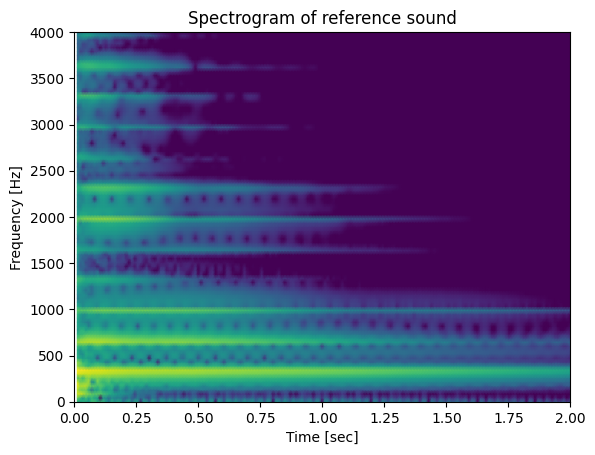

In [142]:
plot_spectrogram(ff, tt, S)
plt.xlim(0, 2)        # limit time axis 
plt.ylim(0, 4000)     # limit frequency axis
plt.title("Spectrogram of reference sound")
plt.show()

1.2. Select a time where almost all harmonics are present and plot the spectrum at that time.

In [6]:
# at about 0.25 seconds it looks like all the harmonics are present 
plot_spectrum_at(ff, tt, S, 0.25)


1.3. Use the cursor for measuring the weights of the fundamental frequency and some harmonics (6-10)

In [7]:
weights = [1, 0.5234, 0.3644, 0.0449, 0.0290, 0.3463, 0.1484, 0.1222, 0.0299, 0.0362]

In [8]:
def synthesize(f0, phi, Ak, t):
  y = 0
  for k in range(1, len(Ak) + 1):
    y += Ak[k-1] * np.cos(2*np.pi*k*f0*t + k*phi - (k-1)*np.pi/2)
  return y

In [9]:
synt = synthesize(329.10, 4.75, weights, t=np.arange(0, 3, 1/fs))

t_start = 0
t_end = 3
plot_signals(ref, sr=fs, t_start=t_start, t_end=t_end)
plot_signals(synt, sr=fs, t_start=t_start, t_end=t_end)

Audio(synt, rate=fs)


2.2. Calculate the spectrogram of the synthesized signal `S_synt`; and compare the spectrums of both signals at the same time using `plot_spectrum_at(ff, tt, [S_ref, S_synt], time)`, where `S_ref`is spectrogram of the reference signal.

**Note:** use the same window length to calculate both spectrograms.

In [10]:
ff_synt, tt_synt, S_synt = spectrogram(synt, fs=fs, nperseg=1024, noverlap=512)
ff, tt, S_ref = spectrogram(ref, fs=fs, nperseg=1024, noverlap=512)

plot_spectrum_at(ff, tt, [S_ref, S_synt], 0.25)



2.3. Compare the spectrograms of the two signals. What are the main differences?

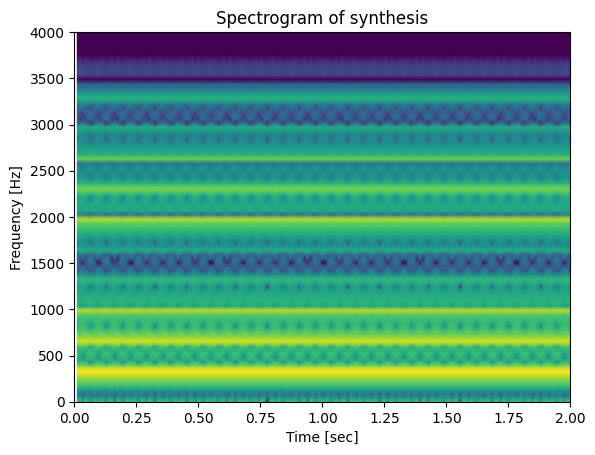

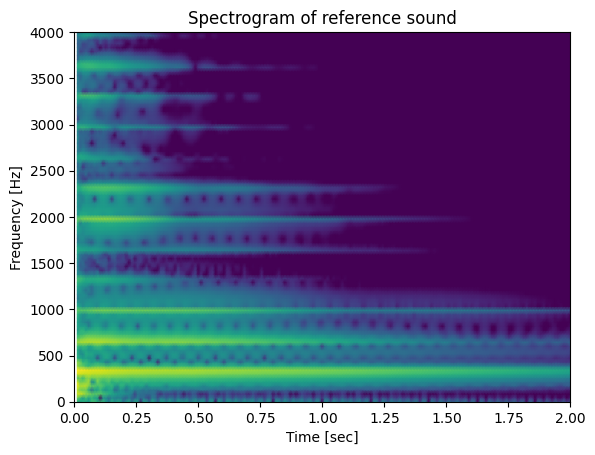

In [11]:
plot_spectrogram(ff_synt, tt_synt, S_synt)
plt.xlim(0, 2)        # limit time axis 
plt.ylim(0, 4000)     # limit frequency axis
plt.title("Spectrogram of synthesis")
plt.show()

plot_spectrogram(ff, tt, S_ref)
plt.xlim(0, 2)        # limit time axis 
plt.ylim(0, 4000)     # limit frequency axis
plt.title("Spectrogram of reference sound")
plt.show()

The intensity is higher across the entire spectrogram of the synthesis compared to the reference sound, and of course each column in the synthesis spectrogram is identical, meaning none of the frequencies decay over time which makes it look drastically different to the reference one.

2.4. Listen to the two audios (reference and synthesized). What are the main differences?

In [90]:
print("Reference Sound")
Audio(ref, rate=fs)


Reference Sound


The note seems to be getting pretty close, but without the envelope and the intensities it's difficult to approach the sound of the original note. Also the original note is really quiet so once we can get that to match more closely using the intensity values it'll sound much more similar.